<a href="https://colab.research.google.com/github/trucoshan/capstones/blob/main/PaisaBazaar_EDA_Capstone_Project_Shantanu.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    -  **Paisabazaar Banking Fraud Analysis**



##### **Project Type**    - **Exploratory Data Analysis**
##### **Contribution**    - **Individual**
##### **Name**            - **Shantanu Das**

# **Project Summary -**

Paisabazaar is a financial services platform that helps customers compare and apply for banking products like loans and credit cards. One of the most important aspects of their business is evaluating a person's creditworthiness, which helps reduce the chances of loan defaults and improves the quality of financial recommendations. The credit score is a key metric used to assess whether a customer is likely to repay their debts on time.

This project focuses on analyzing customer-level financial data to understand the behaviors and characteristics associated with different credit scores. The dataset includes features such as age, occupation, number of loans, credit inquiries, payment behavior, income, and credit card usage. These variables were explored in depth to identify what factors correlate strongly with poor, standard, or good credit scores.

The first step involved data cleaning and preprocessing. Missing values were handled, inconsistent entries were corrected, column types were fixed, and derived columns were created to make the data easier to work with. Incomes below the expected minimum were standardized, and special cases like underage customers were flagged for separate analysis.

Univariate and bivariate analysis was performed using Pandas, Seaborn, Matplotlib, and Plotly. The idea was to first understand how individual variables behave and then explore their relationships with credit scores. For example, we looked at how credit scores varied with the number of delayed payments, or how the monthly income distribution differed across credit categories. We also explored if people with more credit inquiries were more likely to have a poor score.

A separate angle of analysis was done for customers below the age of 18. Since younger customers often have limited credit history or different financial behavior, we explored whether their credit profiles followed the same patterns as the general population. This provided useful insight for building more inclusive credit models.

I also did a time-based grouping of loan counts by month and credit score to see if any seasonal borrowing patterns existed. This kind of trend analysis can help in understanding when customers are more likely to apply for credit and how their financial behavior changes over time.

Overall, the project successfully identified key trends and risk factors tied to credit score classifications. These insights can help Paisabazaar improve their credit risk assessment processes, make smarter lending decisions, and tailor financial products to fit each customer's needs more accurately. The project also sets a strong foundation for building machine learning models to predict credit scores in future work.

# **GitHub Link -**

[**(Click Here)** To Go To My GitHub Repo! 🔗](https://github.com/trucoshan/capstones.git)

# **Problem Statement**


**To explore and understand how different financial behaviors and customer attributes relate to an individual's credit score, by analyzing trends, distributions, and patterns in the dataset, and also attempt to answer the following questiions.**

1. Does a higher annual income correlate with a higher credit score?
2. Does the credit utilization ratio have a greater impact on credit scores compared to the total number of loans taken?
3. Is having a higher number of credit cards associated with a higher credit score, assuming the credit utilization ratio is managed well?
4. Is there a negative correlation between the number of delayed payments and credit scores?
5. What is the distribution of credit scores across different age groups?
6. Are there noticable trends or seasonal patterns in credit scores based on the month of the year?
7. How does annual income vary with credit score ranges?

#### **Define Your Business Objective?**

The main goal of this analysis is to help **Paisabazaar** better understand how customer income, spending habits, credit card usage, and repayment behavior relate to their credit scores.

By uncovering key trends, missing data patterns, and customer segments with higher financial risk, this exploration can assist in:

*   Improving internal credit assessment procedures
*   Identifying red flags in customer behavior
*   Making future recommendations more data-informed

These insights can eventually help reduce loan defaults, improve customer targeting, and optimize risk management strategies.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 20 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [227]:
# Importing Libraries
import pandas as pd # Importing Pandas
import numpy as np # Importing NumPy
import matplotlib.pyplot as plt # Importing pyplot from matplotlib
# So that charts are formed right below the cell
%matplotlib inline
import seaborn as sns # Importing Seaborn
import plotly.express as px # Importing express from plotly
import warnings # Importing warnings
warnings.filterwarnings("ignore") # Filtering warnings to ignore
pd.set_option('display.max_columns',None) # So that all the columns are shown

# Seting default Plotly template
px.defaults.template = "plotly_white" # Setting default plotly template to white

### Dataset Loading

In [228]:
# Mounting Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [229]:
# Loading the Dataset
df = pd.read_csv("/content/drive/MyDrive/Module 2 Capstone/dataset.csv") # assigning dataset to df

### Dataset First View

In [230]:
# viewing first 5 rows of dataset
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,5634,3392,1,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,7.0,11.27,4.0,Good,809.98,26.822620,265.0,No,49.574949,21.46538,High_spent_Small_value_payments,312.494089,Good
1,5635,3392,2,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,4.0,11.27,4.0,Good,809.98,31.944960,266.0,No,49.574949,21.46538,Low_spent_Large_value_payments,284.629162,Good
2,5636,3392,3,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",3.0,7.0,11.27,4.0,Good,809.98,28.609352,267.0,No,49.574949,21.46538,Low_spent_Medium_value_payments,331.209863,Good
3,5637,3392,4,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",5.0,4.0,6.27,4.0,Good,809.98,31.377862,268.0,No,49.574949,21.46538,Low_spent_Small_value_payments,223.451310,Good
4,5638,3392,5,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,4.0,"Auto Loan, Credit-Builder Loan, Personal Loan,...",6.0,4.0,11.27,4.0,Good,809.98,24.797347,269.0,No,49.574949,21.46538,High_spent_Medium_value_payments,341.489231,Good


In [231]:
# viewing last 5 rows of dataset
df.tail()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
99995,155625,37932,4,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"Auto Loan, and Student Loan",23.0,7.0,11.5,3.0,Good,502.38,34.663572,378.0,No,35.104023,24.028477,High_spent_Large_value_payments,479.866228,Poor
99996,155626,37932,5,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"Auto Loan, and Student Loan",18.0,7.0,11.5,3.0,Good,502.38,40.565631,379.0,No,35.104023,24.028477,High_spent_Medium_value_payments,496.651610,Poor
99997,155627,37932,6,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"Auto Loan, and Student Loan",27.0,6.0,11.5,3.0,Good,502.38,41.255522,380.0,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083,Poor
99998,155628,37932,7,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"Auto Loan, and Student Loan",20.0,6.0,11.5,3.0,Good,502.38,33.638208,381.0,No,35.104023,24.028477,Low_spent_Large_value_payments,319.164979,Standard
99999,155629,37932,8,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,6.0,7.0,2.0,"Auto Loan, and Student Loan",18.0,6.0,11.5,3.0,Good,502.38,34.192463,382.0,No,35.104023,24.028477,High_spent_Medium_value_payments,393.673696,Poor


### Dataset Rows & Columns count

In [232]:
# Checking number of rows and columns
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

Number of rows: 100000
Number of columns: 28


### Dataset Information

In [233]:
# Dataset information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  int64  
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  float64
 5   SSN                       100000 non-null  float64
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  float64
 10  Num_Credit_Card           100000 non-null  float64
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  float64
 13  Type_of_Loan              100000 non-null  ob

#### Duplicate Values

In [234]:
# Duplicate values
print(f"Number of completely duplicated rows: {df.duplicated().sum()}")

Number of completely duplicated rows: 0


#### Missing Values/Null Values

In [235]:
# Checking for Missing/Null values
df.isnull().sum()

,0
ID,0
Customer_ID,0
Month,0
Name,0
Age,0
SSN,0
Occupation,0
Annual_Income,0
Monthly_Inhand_Salary,0
Num_Bank_Accounts,0


In [236]:
# There are no null values in any column
# Visualization of null values
missing_df = df.isnull().sum().reset_index() # Making a new dataframe for holding missing values
missing_df.columns = ['Feature', 'Missing Values'] # Setting column names
missing_df = missing_df[missing_df['Missing Values'] > 0] # Subsetting to the new dataframe, all rows where missing values are present

#plotting a bar plot to visualize the missing values if any
fig = px.bar(missing_df, x='Missing Values',y='Feature',orientation='h',title='Missing Values per Feature',color='Missing Values',color_continuous_scale='Oranges')
fig.show()

### What did you know about your dataset?

The dataset consists of **100,000** loan records of **12,500** individuals, with **28** columns containing **personal, demographic** and **financial** information of each individual loan holder. Breaking down the data into key features reveal:

* **Personal Information**: Age, Occupation, SSN, Name

* **Personal Financial Information**: Annual Income, Monthly In-hand Salary, Number of Bank Accounts, Credit Cards, Loans, Interest Rate

* **Credit Related Information**: Credit Utilization Ratio, Outstanding Debt, Credit History Age, Credit Mix

* **Behavioral Metrics**: Payment Behavior, Delayed Payments, Credit Inquiries, Payment of Minimum Amount

* <u>**Target Variable**</u>: Credit Score (Good, Standard, Poor).

## ***2. Understanding Your Variables***

In [237]:
# Dataset Columns
print("  The column names are:")
print("------------------------")

step = 1

for i in df.columns:
  print(f"{step}.) {i}")
  step += 1

  The column names are:
------------------------
1.) ID
2.) Customer_ID
3.) Month
4.) Name
5.) Age
6.) SSN
7.) Occupation
8.) Annual_Income
9.) Monthly_Inhand_Salary
10.) Num_Bank_Accounts
11.) Num_Credit_Card
12.) Interest_Rate
13.) Num_of_Loan
14.) Type_of_Loan
15.) Delay_from_due_date
16.) Num_of_Delayed_Payment
17.) Changed_Credit_Limit
18.) Num_Credit_Inquiries
19.) Credit_Mix
20.) Outstanding_Debt
21.) Credit_Utilization_Ratio
22.) Credit_History_Age
23.) Payment_of_Min_Amount
24.) Total_EMI_per_month
25.) Amount_invested_monthly
26.) Payment_Behaviour
27.) Monthly_Balance
28.) Credit_Score


In [238]:
# deleting the temporary variables
del step
del i

In [239]:
# Dataset describe for numeric values
df.describe()

,ID,Customer_ID,Month,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,80631.500000,25982.666640,4.500000,33.316340,5.004617e+08,50505.123449,4197.270835,5.368820,5.533570,14.53208,3.532880,21.08141,13.313120,10.470323,5.798250,1426.220376,32.285173,221.220460,107.699208,55.101315,392.697586
std,43301.486619,14340.543051,2.291299,10.764812,2.908267e+08,38299.422093,3186.432497,2.593314,2.067098,8.74133,2.446356,14.80456,6.237166,6.609481,3.867826,1155.129026,5.116875,99.680716,132.267056,39.006932,201.652719
min,5634.000000,1006.000000,1.000000,14.000000,8.134900e+04,7005.930000,303.645417,0.000000,0.000000,1.00000,0.000000,0.00000,0.000000,0.500000,0.000000,0.230000,20.000000,1.000000,0.000000,0.000000,0.007760
25%,43132.750000,13664.500000,2.750000,24.000000,2.451686e+08,19342.972500,1626.594167,3.000000,4.000000,7.00000,2.000000,10.00000,9.000000,5.380000,3.000000,566.072500,28.052567,144.000000,29.268886,27.959111,267.615983
50%,80631.500000,25777.000000,4.500000,33.000000,5.006886e+08,36999.705000,3095.905000,5.000000,5.000000,13.00000,3.000000,18.00000,14.000000,9.400000,5.000000,1166.155000,32.305784,219.000000,66.462304,45.156550,333.865366
75%,118130.250000,38385.000000,6.250000,42.000000,7.560027e+08,71683.470000,5957.715000,7.000000,7.000000,20.00000,5.000000,28.00000,18.000000,14.850000,8.000000,1945.962500,36.496663,302.000000,147.392573,71.295797,463.215683
max,155629.000000,50999.000000,8.000000,56.000000,9.999934e+08,179987.280000,15204.633333,11.000000,11.000000,34.00000,9.000000,62.00000,25.000000,29.980000,17.000000,4998.070000,50.000000,404.000000,1779.103254,434.191089,1183.930696


In [240]:
# Dataset describe for objects
df.describe(include=['object'])

,Name,Occupation,Type_of_Loan,Credit_Mix,Payment_of_Min_Amount,Payment_Behaviour,Credit_Score
count,100000,100000,100000,100000,100000,100000,100000
unique,10128,15,6261,3,3,6,3
top,Jessicad,Lawyer,No Data,Standard,Yes,Low_spent_Small_value_payments,Standard
freq,48,7096,11408,45848,52326,28616,53174


### Variables Description

| **Column Name**             | **Content Description**                                                                 | **Short Note**                            |
|----------------------------|------------------------------------------------------------------------------------------|--------------------------------------------|
| ID                         | Unique ID of the record                                                                 | Record identifier                          |
| Customer_ID                | Unique ID of the customer                                                               | Customer-specific identifier               |
| Month                      | Month of the year                                                                       | Time reference                             |
| Name                       | The name of the person                                                                  | Personal info                              |
| Age                        | The age of the person                                                                   | Demographic                                |
| SSN                        | Social Security Number of the person                                                    | Identity field                             |
| Occupation                 | The occupation of the person                                                            | Employment type                            |
| Annual_Income              | The annual income of the person                                                         | Salary metric                              |
| Monthly_Inhand_Salary      | The monthly in-hand salary of the person                                                | Take-home pay                              |
| Num_Bank_Accounts          | The number of bank accounts of the person                                               | Financial activity                         |
| Num_Credit_Card            | Number of credit cards held by the person                                               | Credit exposure                            |
| Interest_Rate              | Interest rate on the credit card of the person                                          | Debt cost indicator                        |
| Num_of_Loan                | The number of loans taken by the person from the bank                                   | Loan load                                  |
| Type_of_Loan              | Types of loans taken by the person from the bank                                        | Loan diversity                             |
| Delay_from_due_date        | Avg. number of days delayed in payment                                                  | Payment discipline                         |
| Num_of_Delayed_Payment     | Number of delayed payments                                                              | Frequency of late payments                 |
| Changed_Credit_Limit       | % change in credit card limit                                                           | Credit flexibility                         |
| Num_Credit_Inquiries       | Number of credit inquiries made by the person                                           | Recent credit-seeking behavior             |
| Credit_Mix                 | Classification of credit mix                                                            | Credit profile variety                     |
| Outstanding_Debt           | Outstanding balance of the person                                                       | Unpaid dues                                |
| Credit_Utilization_Ratio   | Ratio of credit utilized out of total available credit                                  | Debt usage intensity                       |
| Credit_History_Age         | Age of the credit history of the person                                                 | Experience with credit                     |
| Payment_of_Min_Amount      | Whether the minimum amount was paid (Yes/No/NM)                                         | Repayment compliance                       |
| Total_EMI_per_month        | Total Equated Monthly Installments paid by the person                                   | Monthly debt obligation                    |
| Amount_invested_monthly    | Monthly amount invested by the person                                                   | Financial planning metric                  |
| Payment_Behaviour          | Observed payment behavior                                                               | Subjective behavioral tag                  |
| Monthly_Balance            | Remaining monthly balance after expenses                                                | Cash flow insight                          |
| Credit_Score               | Credit score of the person                                                              | Target variable                            |


### Check Unique Values for each variable.

In [241]:
# Checking number of unique values for each variable
df.nunique()

,0
ID,100000
Customer_ID,12500
Month,8
Name,10128
Age,43
SSN,12500
Occupation,15
Annual_Income,12488
Monthly_Inhand_Salary,13241
Num_Bank_Accounts,12


In [242]:
# The columns --> ID, Customer ID, Name, SSN, Annual_Income, 'Monthly_Inhand_Salary',
# Type_of_Loan, Changed_Credit_Limit, Outstanding_Debt, Credit_Utilization_Ratio,
# Credit_History_Age, Total_EMI_per_month, Amount_invested_monthly, Monthly_Balance
# Have huge number of unique values
# Checking the unique values for the rest

df_temp = df[['Num_Credit_Inquiries', 'Credit_Score', 'Payment_of_Min_Amount', 'Credit_Mix', 'Num_Credit_Card', 'Num_of_Loan',
              'Delay_from_due_date', 'Payment_Behaviour', 'Num_Bank_Accounts', 'Age', 'Interest_Rate', 'Month',
              'Num_of_Delayed_Payment', 'Occupation']]

step = 1

for i in df_temp.columns:
    print(f"{step}.) Unique values in the column '{i}' are: {df_temp[i].unique()}\n")
    step += 1

1.) Unique values in the column 'Num_Credit_Inquiries' are: [ 4.  2.  3.  5.  9.  8.  7.  6.  0.  1. 10. 11. 12. 17. 13. 14. 16. 15.]

2.) Unique values in the column 'Credit_Score' are: ['Good' 'Standard' 'Poor']

3.) Unique values in the column 'Payment_of_Min_Amount' are: ['No' 'NM' 'Yes']

4.) Unique values in the column 'Credit_Mix' are: ['Good' 'Standard' 'Bad']

5.) Unique values in the column 'Num_Credit_Card' are: [ 4.  5.  1.  7.  6.  8.  3.  9.  2. 10. 11.  0.]

6.) Unique values in the column 'Num_of_Loan' are: [4. 1. 3. 0. 2. 7. 5. 6. 8. 9.]

7.) Unique values in the column 'Delay_from_due_date' are: [ 3.  5.  6.  8.  7. 13. 10.  0.  4.  9.  1. 12. 11. 30. 31. 34. 27. 14.
  2. 16. 17. 15. 23. 22. 21. 18. 19. 52. 51. 48. 53. 26. 43. 28. 25. 20.
 47. 46. 49. 24. 61. 29. 50. 58. 45. 59. 55. 56. 57. 54. 62. 36. 41. 33.
 32. 39. 44. 42. 60. 35. 38. 40. 37.]

8.) Unique values in the column 'Payment_Behaviour' are: ['High_spent_Small_value_payments' 'Low_spent_Large_value_paymen

In [243]:
# deleting variables created above as these will not be required further
# and to avoid file from taking up un-necessary space

del df_temp
del step
del i

## 3. ***Data Wrangling***

### Data Wrangling Code

In [244]:
### Getting code ready for analysis ###

# Dropping personal identifiers like ID, Customer_ID, Name, and SSN
df = df.drop(columns=['ID', 'Customer_ID', 'Name', 'SSN'])

# Typecasting Age, Num_Bank_Accounts, Num_Credit_Card, Num_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment
# Num_Credit_Inquiries, Credit_History_Age from float to int

df[['Age', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Num_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
    'Num_Credit_Inquiries', 'Credit_History_Age']] = df[['Age', 'Num_Bank_Accounts', 'Num_Credit_Card', 'Num_of_Loan',
                                                         'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Num_Credit_Inquiries',
                                                         'Credit_History_Age']].astype(int)

# Rounding the columns 'Annual_Income','Monthly_Inhand_Salary','Outstanding_Debt'
# Total_EMI_per_month','Amount_invested_monthly','Monthly_Balance' to 2 digits after decimal

df[['Annual_Income','Monthly_Inhand_Salary','Outstanding_Debt','Total_EMI_per_month',
    'Amount_invested_monthly','Monthly_Balance']] = df[['Annual_Income','Monthly_Inhand_Salary','Outstanding_Debt','Total_EMI_per_month',
                                                        'Amount_invested_monthly','Monthly_Balance']].apply(lambda x : round(x,2))

# All interest rates are actually whole number disguised as floats without any value after decimal point
# Converting values to integer format
df['Interest_Rate'] = df['Interest_Rate'].astype(int)

# There are loans taken by individuals of age < 18 as well
# Making a separate dataframe that has only these data
# While the original contains all data

df_underage = df[df['Age']<18]

# Creating a dataframe to calculate the percentage distribution of each Credit Score category
# across the entire dataset. This helps us understand the overall credit behavior profile of the population.
df_credit_score_percentage = pd.DataFrame(df.groupby('Credit_Score')['Credit_Score'].apply(lambda x:(x.count()*100)/df['Credit_Score'].count()).reset_index(name='Percentage'))

# Creating a similar percentage distribution, but specifically for the underage segment.
# This allows us to compare how Credit Scores are distributed for younger users
# and spot any deviations from the general population's credit profile.
df_underage_credit_score_percentage = pd.DataFrame(df_underage.groupby('Credit_Score')['Credit_Score'].apply(lambda x:(x.count()*100)/df_underage['Credit_Score'].count()).reset_index(name='Percentage'))

# Ensuring a minimum annual income of 15,000 (in local currency) for all entries to handle unrealistic low-income values

def minwage(val):
    if val<15000:
        val = 15000
    else:
        val = val
    return val

df['Annual_Income_fixed'] = df['Annual_Income'].apply(lambda x: minwage(x))

# Ensuring a minimum monthly salary of 1,250 (in local currency) for all entries to handle unrealistically low-income values

def minsal(sal):
  if sal<1250:
    sal = 1250
  else:
    sal = sal
  return sal

df['Monthly_Inhand_Salary_fixed'] = df['Monthly_Inhand_Salary'].apply(lambda x: minsal(x))

# Calculating the number of loans taken each month, grouped by credit score category
# Setting it to a new dataframe
monthly_loan_counts = df.groupby(['Month', 'Credit_Score']).size().reset_index(name='Loan_Count')

# Selecting only the numerical columns from the dataset for analysis
# Assigning it to a new dataframe
# Dropping the updated annual income column from it as it is not requred in the new datadframe for the purpose it is made
num_df = df.select_dtypes(include='number')
num_df = num_df.drop(columns=['Annual_Income_fixed','Monthly_Inhand_Salary_fixed'])

In [245]:
# Deleting un-necessary variables and functions

del minwage
del minsal

### What all manipulations have you done and insights you found?

# **Manipulations done**

* <u>**Dropped personal identifiers**</u>: Removed columns like **ID, Customer_ID, Name, and SSN** to maintain privacy and reduce irrelevant data noise. Analysis was done on the basis of each loan as a standalone unit.

* <u>**Typecasting to integer**</u>: Converted float-type columns (Age, Num_Bank_Accounts, Num_Credit_Card, Num_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Num_Credit_Inquiries, and Credit_History_Age) to integer format for easier handling and consistency, as they are either a count or age.

* <u>**Rounded financial metrics**</u>: Rounded values in columns like Annual_Income, Monthly_Inhand_Salary, Outstanding_Debt, Total_EMI_per_month, Amount_invested_monthly, and Monthly_Balance to 2 decimal places for cleaner reporting.

* <u>**Normalized interest rates**</u>: Converted Interest_Rate column from float to integer, recognizing that they had no real decimal precision.

* <u>**Flagged underage records**</u>: Identified and separated individuals with age < 18 into a new DataFrame df_underage for targeted exploration. This step took some time as the income amounts did not reflect it being INR, so I did research and looked for countries where that amount of income makes sense in that place's local currency and none of those places had the laws that allowed under 18s to work and hold jobs and take those types of loans.

* <u>**Credit score distribution (entire population)**</u>: Created a percentage breakdown of credit score classes (Poor, Standard, Good) across the full dataset to understand the general credit profile.

* <u>**Credit score distribution (underage population)**</u>: Did a similar distribution analysis specifically for underage individuals to detect if their score trends deviate from the norm.

* <u>**Minimum wage thresholding**</u>: Applied a rule to ensure all Annual_Income and Monthly_Inhand_Salary values were at realistic levels. Values below 15,000 for Annual_Income and 1250 for Monthly_Inhand_Salary, were replaced with 15,000 for Annual_Income and 1250 for Monthly_Inhand_Salary, in new columns Annual_Income_fixed and Monthly_Inhand_Salary_fixed. From the research done that is mentioned under the point <u>**'Flagged underage records'**</u> it was seen that in none of the valid countries, a minimum annual income of 7005 and a minimum monthly income of 303, in that currency, made sense so I did some research on the minimum wages and laws surrounding that, calculated the minimum wages for each country, namely:
 * USA
 * Singapore
 * UAE

 ##### and then calculated their average and rounded it out to the closest complete round figure which came out to be **15000** for the Annual Income and **1250** for the Monthly Inhand Salary. Countries such as Germany, France, CAnada, Australia, Kuwait and Israel were considered, but their minimum wage values were high in contrast to the income range in the dataset.

 ##### <u>**(Of note: I chose to avoid treating the higher salaries, potential outliers, as there is almost always a minimum wage. But there is no such thing as a maximum wage and different individuals holding the same position, may earn very different with some earning quite high compared to the average)**</u>

* <u>**Loan counts per month**</u>: Created a DataFrame monthly_loan_counts showing how many loans were taken in each month, broken down by credit score, to track trends across time.

* <u>**Numerical data subset for analysis**</u>: Created a separate DataFrame num_df containing only numerical columns (excluding the fixed income column) for correlation analysis, statistical summaries, or heatmap generation.

# **Key Insights Identified**

* <u>Underage Borrowers Exist</u>: The dataset contains users below the legal lending age and below legal labor age **(in most countries, which applies to individuals under the age of 18)**, which could indicate data entry issues or potential fraud/edge cases.

* <u>Imbalanced Income Data</u>: Some individuals had unrealistically low income, which was corrected to a base threshold—indicating possible noise or outliers in salary-related entries.

* <u>Interest Rate Misrepresentation</u>: Interest rates were stored as floats but had no fractional values—highlighting a possible formatting or export issue during data collection.

* <u>Temporal Loan Behavior</u>: Monthly loan data grouped by credit score can reveal which categories are more financially active and in which months, useful for trend and seasonality analysis.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

In [261]:
# Plot of histogram across Age

fig = px.histogram(df, x='Age', nbins=30, marginal="box", title="Distribution of Age") # Code for plot
fig.update_layout(height=600,width=1000, # Code for updating layout of plot
                  title_font=dict(size=20,color='darkblue'),bargap=0.025)
fig.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

To study the distribution of ages across the dataset.

##### 2. What is/are the insight(s) found from the chart?

High number of loans given to people with ages between 18 and 45. Maximum age in the dataset is 57. Quite a few number of loans given to seemingly underaged individuals (age < 18).

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This insight can help the business:

* Identify which age group dominates to understand whom to target for loan products so that it might be successful.
* Realize that there are loans given to underaged individuals which can open a possible door revealing probable malpractices and possibility of legal actions.

#### Chart - 2

In [262]:
# Pie Chart of Distribution of Loans across Credit Scores

# Grouping by credit score and on the same column, applying the count method and then making that a new column with the name count
# Temporaily renaming the columns for display purposes

fig = px.pie(df.groupby('Credit_Score')['Credit_Score'].count().reset_index(name='Count').rename(columns={'Credit_Score':'Credit Score'}),
             names='Credit Score', values='Count',
             title='Pie Chart of Distribution Of Loans across Credit Scores',
             color='Credit Score',
             color_discrete_sequence=['teal', 'red', 'chocolate'],
            labels={'Credit_Score':'Credit Score','Count':'Distribution'})

fig.update_traces(textinfo='label+percent',textposition='outside',pull=[0.01, 0.01, 0.03]) # Code to update the traces on the map such as text and distance between each section of pie

fig.update_layout(height=700, # Code for updating the layout of the plot
                  width=1200,
                  title_font=dict(size=20,color='indigo'),)
fig.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

I chose the pie chart to get a quick, high-level overview of the distribution of my target variable, Credit_Score. As this is a classification problem, understanding the breakdown of "Good," "Standard," and "Poor" credit scores is essential. The pie chart immediately shows the proportion of each category, which helps me identify if the dataset is imbalanced. An imbalanced dataset (where one class is heavily overrepresented) could affect the performance of my predictive model, and this chart helps me detect that potential issue right away.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* <u>**Standard Credit Scores are the Majority**</u>: The largest portion of the data (53.2%) falls into the "Standard" credit score category. This indicates that most of the customers in the dataset are not at the extreme ends of the credit spectrum.

* <u>**Poor Credit Scores are a Significant Part as well**</u>: The second largest group is the "Poor" credit score category, making up a significant 29.0% of the dataset. This is a substantial group that requires careful attention.

* <u>**Good Credit Scores are the Smallest Group**</u>: The "Good" credit score category is the smallest, at only 17.8% of the dataset.

This shows that the dataset is imbalanced, with "Good" credit scores being the least represented class.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

### The insights will help PaisaBazaar in the following ways:

* <u>**Strategic Focus on a Key Customer Segment**</u>: Knowing that over half of the customers fall into the "Standard" category allows Paisabazaar to focus its efforts on this large group. They can develop specialized programs or financial products designed to help "Standard" customers improve their scores and move into the "Good" category. This could include personalized financial advice, credit-building tools, or targeted loan offers, which would increase customer engagement and loyalty.

* <u>**Targeted Risk Mitigation**</u>: The significant proportion of "Poor" credit scores (29%) is a crucial insight for risk management. The company can develop more stringent risk assessment models for this group and offer them financial products that have a lower risk profile, such as secured loans or credit cards. This would reduce the risk of loan defaults for the company and its partners.

#### Chart - 3

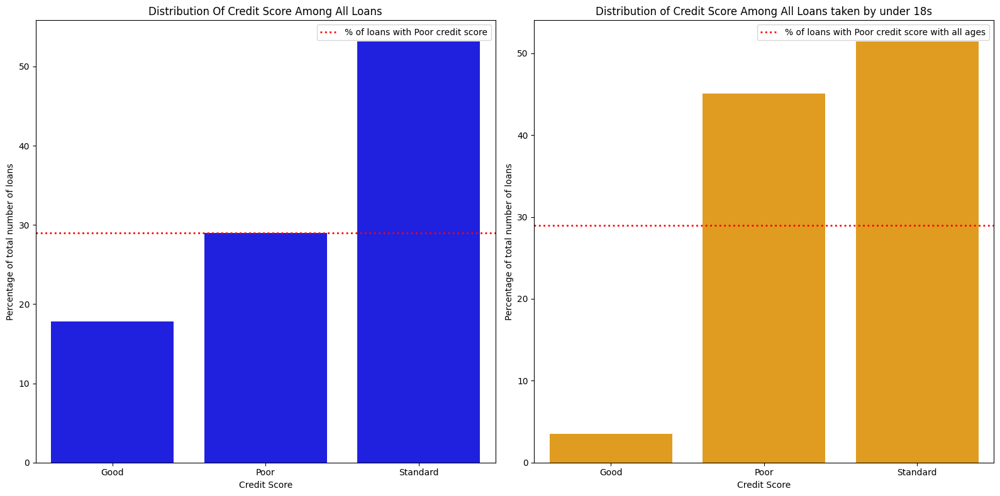

In [263]:
# A barplot showing distribution of credit score among all loans taken and also loans taken by people under 18.

fig, axes = plt.subplots(1,2,figsize=(16,8)) # Creating 2 subplots

# Code for barplot using data from entire dataset
sns.barplot(data=df_credit_score_percentage,x='Credit_Score',y='Percentage',color='Blue',ax=axes[0],order=df_credit_score_percentage['Credit_Score'].value_counts().index)
axes[0].axhline(y=29,color='Red',linestyle=':',linewidth=2,label='% of loans with Poor credit score') # Plotting a horizontal line parallel to x-axis
axes[0].set_title('Distribution Of Credit Score Among All Loans') # Setting title
axes[0].set_xlabel('Credit Score') # Labelling x-axis
axes[0].set_ylabel('Percentage of total number of loans') # Labelling y-axis
axes[0].legend(loc='upper right') # Setting legend location

# Code for barplot using data from only underage dataset
sns.barplot(data=df_underage_credit_score_percentage,x='Credit_Score',y='Percentage',color='Orange',ax=axes[1],order=df_underage_credit_score_percentage['Credit_Score'].value_counts().index)
axes[1].axhline(y=29,color='Red',linestyle=':',linewidth=2,label='% of loans with Poor credit score with all ages') # Plotting a horizontal line parallel to x-axos
axes[1].set_title('Distribution of Credit Score Among All Loans taken by under 18s') # Setting title
axes[1].set_xlabel('Credit Score') # Labelling x-axis
axes[1].set_ylabel('Percentage of total number of loans') # Labelling y-axis
axes[1].legend(loc='upper right') # Setting legend location

plt.tight_layout()
plt.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

This chart clearly visualizes how among the loans taken by individuals under 18, had significantly higher percentage of Poor credit score holders and significantly percentage number of Good credit score holders.

##### 2. What is/are the insight(s) found from the chart?

Since there is a clear increase in the percentage of Poor credit score holders and significantly percentage number of Good credit score holders, it means that those loan holders are defaulting more, possibly signifying fraudulent activity.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, it will help the business create a positive impact. It will make stakeholders aware of such activities and look into how those loans were approved and who approved them. It can show inconsistencies in their system and/or possible malpractices among staff members who are involved. It can also reveal inconsistency in their data gathering methods and practices.

#### Chart - 4

In [264]:
# Boxplot of Age across Credit Scores and comparison with Payment Behavior

fig = px.box(df.rename(columns={'Credit_Score':'Credit Score','Payment_Behaviour':'Payment Behaviour'}),x='Credit Score',y='Age', # Temporarily renamed columns for visual appeal
             title='Boxplot of Age Across Credit Scores', # Setting title of chart
             color='Payment Behaviour')
fig.update_layout(height=800, # Updaing the layout of the plot
                  width=1500,
                  title_font=dict(size=20,color='darkblue'))
fig.show() # Displaying the chart

##### 1. Why did you pick the specific chart?

This chart does a good job in helping to visualize the distribution of age across the 3 credit score categories in relation to the payment behavior.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* It is evident from the above chart that people with lower age tend to have a poor credit score and the credit score seems to improve as age increases.

* People with poor and standard credit scores, and who spend lesser while only spending on small value payments, tend to be quite younger.

* People with poor credit score, and who spend more while only spending on large value payments, tend to be quite comparatively older.

* People with good credit score have a very uniform spending habit, signifying good knowledge of how credit works.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes it will help PaisaBazaar by identifying risky individuals by the basis of age and spending habit. It will open multiple doors for them by identifying risky individuals to either not give them loans if too risky, or provide education to the individuals who are already loan/credit card holders.

#### Chart - 5

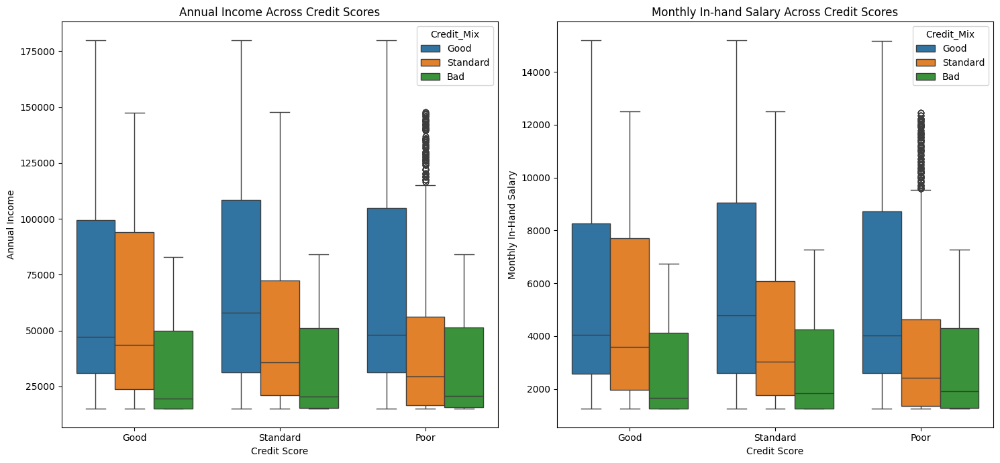

In [265]:
# Boxplots showing Annual Income and Monthly in-hand Salary across credit Scores

fig, axes = plt.subplots(1,2,figsize=(15,7)) # Making subplots

sns.boxplot(data=df,x='Credit_Score',y='Annual_Income_fixed',order=['Good', 'Standard', 'Poor'],ax=axes[0],hue='Credit_Mix') # Making a boxplot and setting order of boxes
axes[0].set_title('Annual Income Across Credit Scores') # Setting title
axes[0].set_xlabel('Credit Score') # Setting label for x-axis
axes[0].set_ylabel('Annual Income') # Setting y-axis label

sns.boxplot(data=df,x='Credit_Score',y='Monthly_Inhand_Salary_fixed',order=['Good', 'Standard', 'Poor'],ax=axes[1],hue='Credit_Mix') # Making a boxplot and setting order of boxes
axes[1].set_title('Monthly In-hand Salary Across Credit Scores') # Setting title
axes[1].set_xlabel('Credit Score') # Setting x-axis label
axes[1].set_ylabel('Monthly In-Hand Salary') # Setting y-axis label

plt.tight_layout()
plt.show() # Displaying plots

##### 1. Why did you pick the specific chart?

I chose a boxplot to show distribution of income (yearly and monthly) across credit scores and in relation to credit mix, because it visualizes very well where individuals with a certain credit score lies and what does the credit mix look like there.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* People with lower income tend to have bad Credit Mix regardless of Credit Score, signaling a possible lack of financial education about credit systems

* People with Poor Credit Score but Good Credit Mix, tend to have a comparatively higher income on par with people with Good Credit Score and Good Credit Mix.

* People with a Standard Credit Score and Good Credit Mix, tend to be among the highest earners.

* Most outliers in income lie with Poor Credit Score and Standard Credit Mix holders, possibly signifying incomplete education about financial and credit systems.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This is of immense help to PaisaBazaar as it gives them an opportunity to educate individuals with a Poor Credit History and a Standard Credit Mix, so that they have complete knowledge of systems and individuals among them can improve their credit score and as such procure more loans which will not be a problem at the time as the credit worthiness of those individuals will have increased.

#### Chart - 6

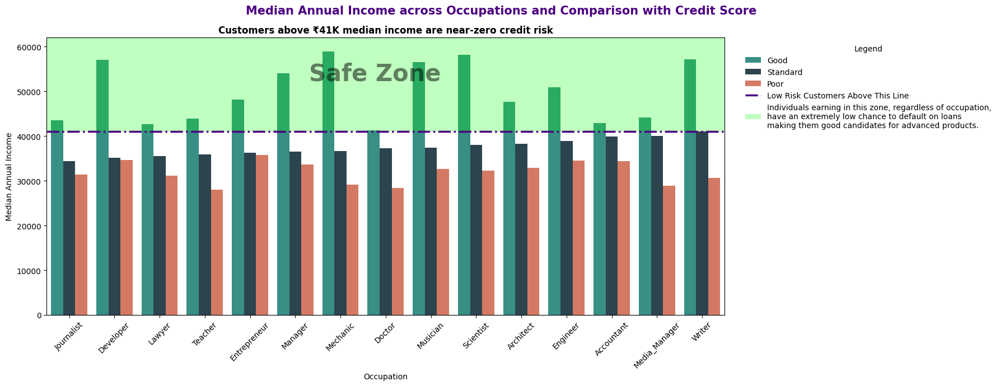

In [266]:
# Barplot of Median Annual Income across all Occupations and Comparison with Credit Score

# Creating a new dataframe grouping by occupation and credit score
# Aggregating median of annual income
df_x = df.groupby(['Occupation','Credit_Score']).agg({'Annual_Income_fixed':'median'}).reset_index()
df_x.columns = ['Occupation','Credit_Score','Median_Income'] # Setting names of the columns

plt.figure(figsize=(18,7)) # Specifying size of plot
sns.barplot(data=df_x,x='Occupation',y='Median_Income',hue='Credit_Score',hue_order=['Good','Standard','Poor'], # Creating a bar plot and assigning hue as credit score
            palette={'Good': '#2a9d8f','Standard': '#264653','Poor': '#e76f51'},gap=0.001,
           order=df_x[df_x['Credit_Score']=='Standard'].sort_values(by='Median_Income')['Occupation'])
plt.suptitle('Median Annual Income across Occupations and Comparison with Credit Score',fontsize=15,fontweight='bold',color='indigo') # Plotting a super-title for the chart
plt.title('Customers above ₹41K median income are near-zero credit risk', fontsize=12, color='black',fontweight='bold') # Plotting an observation as title
plt.ylabel('Median Annual Income') # Setting y-label
plt.ylim(0, 62000) # Specifying limit of y-axis
plt.axhline(y=41000,color='indigo',label='Low Risk Customers Above This Line',linestyle='-.',linewidth=2.5) # Plotting horizontal line parallel to x-axis
plt.text(x=5.3,y=52500,s='Safe Zone',alpha=0.5,color='black',fontdict={'weight':'bold','size':30}) # Plotting text on 'Safe Zone of chart'
plt.axhspan(41000,62000,facecolor='lime',alpha=0.25, # Filling the safe zone with lime color to highlight it
            label='Individuals earning in this zone, regardless of occupation,\nhave an extremely low chance to default on loans\nmaking them good candidates for advanced products.')
plt.legend(title='Legend',loc='upper left',bbox_to_anchor=(1.02, 1),frameon=False) # Assigning legend to be outside the frame
plt.xticks(rotation=45) # Rotating x-axis ticks to 45 degrees
plt.tight_layout()
plt.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

This chart was chosen to visually compare the median annual income across different occupations, segmented by credit score category (Good, Standard, Poor). Using median instead of mean avoids distortion from outliers and provides a robust central tendency, especially relevant in financial datasets. Additionally, a threshold line at ₹41,000 and a shaded "0 risk zone" give immediate context to how income correlates with credit risk.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* <u>**Credit Score & Income Relationship**</u>: Across almost all occupations, customers with a Good Credit Score have a significantly higher median income than those in the Standard or Poor categories.

* <u>**Occupation-based Credit Risk Pockets**</u>: High-income professions like Scientist, Developer, Musician, and Architect tend to cluster near or above the ₹41,000 median mark — associated with lower credit risk.
In contrast, occupations like Entrepreneur, Writer, and Lawyer show a wider spread, with Poor credit score individuals earning below the safe median, possibly indicating unstable income or inconsistent repayment behavior.

* <u>**Threshold Interpretation**</u>: The ₹41,000 income threshold appears to act as a soft cut-off for low credit risk, as most customers above this band belong to the Good credit category.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

### <u>**Positive Business Impact**</u>:

* <u>**Smarter Loan Segmentation**</u>: PaisaBazaar can tailor risk models to incorporate both credit score and occupation-based median income. This allows for finer credit scoring and interest rate assignment, minimizing default risk while expanding access.

* <u>**Targeted Credit Repair Programs**</u>: For individuals with Standard or Poor scores in high-income roles, the company can design personalized credit improvement solutions — for instance, financial coaching or secured credit card products — to bring them into the lending pool safely.

* <u>**Cross-Selling Opportunities**</u>: High earners in 'safe' roles can be offered investment plans, pre-approved loans, or credit insurance products based on this occupation-income segmentation.

### ❗<u>**Potential Negative Insight (if unaddressed)**</u>:

* <u>**Entrepreneurs as a Hidden Risk**</u>: Despite being typically high-potential clients, Entrepreneurs show similar median incomes in the Poor and Standard Credit Score categories, suggesting volatile cash flows. Ignoring this nuance could lead to higher default rates if occupation is given more weight than income consistency.

#### Chart - 7

In [267]:
# Boxplot of Credit Utilization Ratio across Credit Scores and Comparison with Credit Mix

fig1 = px.box(df, x='Credit_Score', y='Credit_Utilization_Ratio',color='Credit_Mix', color_discrete_sequence=['teal','orange','red'],
              title='Credit Utilization Ratio Across Credit Scores and Comparison with Credit Mix',
              labels={'Credit_Score': 'Credit Score', 'Credit_Utilization_Ratio': 'Credit Utilization Ratio','Credit_Mix':'Credit Mix'})

fig1.update_layout(height=500, # Updating layout of boxplot
                  width=1500,
                  title_font=dict(size=20,color='indigo'))

# Boxplot of Credit Utilization Ratio across Credit Scores and Comparison with Credit Mix

fig2 = px.box(df, x='Credit_Score', y='Num_of_Loan',color='Credit_Mix', color_discrete_sequence=['teal','orange','red'],
              title='Number of Loans Across Credit Scores and Comparison with Credit Mix',
              labels={'Credit_Score': 'Credit Score', 'Num_of_Loan': 'Number of Loans','Credit_Mix':'Credit Mix'})

fig2.update_layout(height=500, # Updating layout of boxplot
                  width=1500,
                  title_font=dict(size=20,color='indigo'))

fig1.show() # Displaying fig 1
fig2.show() # Displaying fig 2

##### 1. Why did you pick the specific chart?

I chose box plots to analyze Credit Utilization Ratio and Number of Loans across different Credit Scores and Credit Mix categories because box plots clearly show distribution, median trends, and outliers.
This chart type is ideal for visually comparing the spread and central tendency of numerical features against categorical groupings.
It helped evaluate whether these two key variables namely, credit utilization and number of loans, significantly differ across credit score classes, and whether credit mix modifies that relationship.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* Credit Utilization Ratio remains remarkably consistent, without too much variation, across all credit scores, even after factoring in Credit Mix. The median hovers between 31.5 to 33.2, indicating a limited role in explaining credit score variations in this dataset.

* In contrast, Number of Loans shows clear variation:

 ##### > Individuals with Good credit scores and/or Good credit mix, tend to have fewer loans.

 ##### > Those with Bad credit mix generally carry more loans, across all credit scores.

 ##### > Individuals with Good or Standard credit scores and Bad credit mix, hold more loans than people with Poor credit score and Bad credit mix.

* The variation in Number of Loans becomes even more pronounced when Credit Mix is introduced, suggesting a compound influence on creditworthiness.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, these insights are directly valuable for credit risk assessment, customer segmentation, and loan approval strategies:

* Lenders can prioritize evaluating the number of active loans and credit mix quality over credit utilization ratio when assessing credit risk.

* Credit models can be made more predictive and focused by emphasizing the loan burden and mix health, helping reduce defaults.

* For financial advisors or app-based credit score tools, these insights can guide users to reduce the number of loans and improve mix, rather than stressing over marginal utilization improvements.

* Overall, this improves decision-making accuracy, helps target the right customers, and contributes to stronger portfolio quality and profitability.

#### Chart - 8

In [268]:
# Scatter Plot of Interest Rate vs Number of Delayed Payments, with an attribute of Outstanding Debt

fig = px.scatter(df,x='Num_of_Delayed_Payment',y='Interest_Rate',size='Outstanding_Debt',
                labels={'Num_of_Delayed_Payment':'Number of Delayed Payments',
                       'Interest_Rate':'Interest Rate',
                      'Outstanding_Debt':'Outstanding Debt'},
                title='Scatter Plot of Interest Rate vs Number of Delayed Payments, with an attribute of Outstanding Debt')

fig.update_layout(height=800, # Updating layout of the plot
                  width=1500,
                  title_font=dict(size=16,color='indigo',weight='bold'))

fig.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

The scatter plot was the ideal choice because it effectively visualizes the relationship between three quantitative variables: Interest Rate (y-axis), Number of Delayed Payments (x-axis), and Outstanding Debt (represented by the size of each point). This chart type allows for a direct comparison of these variables to identify patterns, trends, and correlations, which is crucial for credit risk analysis.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

The primary insight from the chart is the strong positive correlation between the Number of Delayed Payments and the Interest Rate.

* <u>**Low Delayed Payments, Low Rates**</u>: Customers with up to five delayed payments consistently have lower interest rates, typically ranging from 0% to 12.5%.

* <u>**High Delayed Payments, High Rates**</u>: Once the number of delayed payments exceeds five, there is a sharp increase in interest rates, which then stabilize in the 30% to 35% range. This indicates a clear risk threshold that significantly impacts lending terms.

* <u>**Outstanding Debt**</u>: The chart also shows that Outstanding Debt is also increases with increase in interest rate and number of delayed payments, signified by the size of the bubbles. This reveals that as customers with a pattern of delayed payments may struggle to pay down their principal, leading to a higher balance, which is then compounded by high interest rates.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights gained from this analysis, including the corrected understanding of outstanding debt, would lead to significant positive business impacts for Paisabazaar:

* <u>**Enhanced Risk Management**</u>: The analysis provides a clear, data-driven justification for the company's risk-based pricing strategy. By confirming that high delayed payments correlate with both higher interest rates and greater outstanding debt, the company can confidently use this information to refine its credit assessment models. This helps in more accurately identifying high-risk customers, allowing the company to set appropriate interest rates and thus mitigate the risk of loan defaults.

* <u>**Improved Operational Strategy**</u>: The identified risk threshold (around five delayed payments) is a key insight that can be integrated into Paisabazaar's internal processes. The company can use this information to develop more targeted intervention strategies, such as providing early warnings or financial counseling to customers approaching this threshold. This proactive approach can potentially reduce future defaults and improve the overall quality of the loan portfolio.

* <u>**Increased Profitability and Shareholder Value**</u>: By effectively managing risk and optimizing loan offerings, the company can improve its bottom line. A more accurate model leads to fewer losses from defaults and higher revenue from appropriately priced loans. For stockholders, this demonstrates that the company is leveraging its data to make intelligent business decisions, which fosters confidence in the company's financial health and long-term growth prospects.

#### Chart - 9

In [269]:
# Boxplot Showing Relationship Between Credit Utilization Ratio and,<br>Number of Credit Cards In Relation to Credit Score

df['Credit_Utilization_Ratio_bin'] = pd.cut(df['Credit_Utilization_Ratio'], bins=6)
fig = px.violin(df,x='Credit_Score',y='Num_Credit_Card',color='Credit_Utilization_Ratio_bin',
            labels={'Num_Credit_Card':'Number of Credit Cards',
                    'Credit_Utilization_Ratio_bin':'Credit Utilization Ratio',
                    'Credit_Score':'Credit Score'},
            title='Boxplot Showing Relationship Between Credit Utilization Ratio and,<br>Number of Credit Cards In Relation to Credit Score')

fig.update_layout(height=800, # Updating layout of the plot
                  width=1700,
                  title_font=dict(size=18,color='indigo',weight='bold'))

fig.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

I selected a boxplot segmented by credit score and colored by credit utilization ratio bins to visualize how the number of credit cards varies across different credit score categories, while also observing the impact of credit utilization behavior.
Boxplots are ideal for this kind of distributional analysis, as they clearly show medians, spread, and outliers, allowing us to assess whether higher card ownership correlates with better credit standing and how utilization moderates that relationship.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* Individuals with "Good" credit scores do not necessarily have more credit cards than those with "Standard" or "Poor" scores, contrary to what might be expected. Infact, individuals with Good credit score, regardless of credit utilization ratio, held comparatively less number of credit cards.

* There's high variability in the number of credit cards within each credit score group, indicating that card count alone is not a strong predictor of creditworthiness.

* Credit utilization ratio appears to be a more consistent and influential factor, with those in lower utilization bins generally having tighter, more stable distributions across all credit scores.

⚡ <u>**Key Insight**</u>: Merely having more credit cards does not lead to a higher credit score. What truly matters is maintaining a responsible utilization pattern, regardless of card count.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the insights are directly actionable and can drive smarter credit strategies:

* <u>**For lenders**</u>: It highlights the importance of prioritizing credit utilization patterns over sheer card count in credit scoring models or loan risk assessments.

* <u>**For credit product designers**</u>: It justifies the development of controlled-limit cards or usage-based incentives to encourage responsible credit behavior.

* <u>**For customer education teams**</u>: The insight empowers campaigns to debunk myths about card quantity and refocus on healthy financial habits, improving portfolio quality over time.

#### Chart - 10

In [270]:
# Assigning name of month to use rather than number of the month
monthly_loan_counts['Month_Name'] = monthly_loan_counts['Month'].map({1:'January',2:'February',3:'March',
                                        4:'April',5:'May',6:'June',7:'July',8:'August',9:'September'})

# Line plot showing trend of loans taken across months of the year by individuals with different credit scores

fig = px.line(monthly_loan_counts,x='Month_Name',y='Loan_Count',color='Credit_Score',
             labels={'Month_Name':'Month of the Year','Loan_Count':'Number of Loans','Credit_Score':'Credit Score'},
             color_discrete_map={'Good':'Teal','Standard':'Orange','Poor':'Red'},
             title='Trend of Number of Loans taken Across Months By Individuals With Different Credit Scores',
              markers=True)

fig.update_traces(line=dict(width=3)) # Increasing the width of the line

fig.update_layout(height=500, # Updating the layout of the plots
                  width=1700,
                  title_font=dict(size=20,color='indigo',weight='bold'))

fig.show() # Displaying the plots

##### 1. Why did you pick the specific chart?

I chose a line chart with monthly markers because it is well-suited for visualizing temporal trends across a time-based categorical axis—in this case, months (January to August). The goal was to assess whether any seasonal or cyclical variations exist in loan behavior across different credit score segments. A line plot enables us to track changes over time within each credit score category while offering a clear comparative view across groups. The addition of markers at each data point enhances readability and allows better interpretation of individual month-wise fluctuations.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* <u>**Surge in loans by Good credit score individuals in April**</u>: This aligns perfectly with fiscal year planning. These users likely have access to better financial literacy or planning tools and may:

 ##### > Reassess credit needs with the new FY budget.
 ##### > Invest in tax-saving instruments requiring liquidity.
 ##### > Use loans for high-value expenses like business expansion or home improvement.

* <u>**Dip among Standard score borrowers in April**</u>:
Suggests temporary financial caution. They might be awaiting performance bonuses, tax refunds, or closing off liabilities from the previous FY. This group may be more reactive than proactive in financial planning.

* <u>**Steady rise in Poor score borrowers through Q2**</u>:
Indicates increasing credit need possibly due to:

 ##### > Annual fee hikes or bill cycles starting afresh.
 ##### > New school admission expenses or household restructuring (common in Indian fiscal Q1).
 ##### > Lack of planning; reacting to fiscal strain rather than preparing for it.



These trends, while not very strongly seasonal, do indicate shifts in behavior that most probably correlates to <u>**April**</u> being the <u>**Financial New Year**</u>.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* <u>**Timing is not just seasonal, it's fiscal**</u>: Businesses can now align campaigns with consumer intent cycles—April is a month of renewed budgets and decisions. Smart segmentation can help push:
 ##### > Personal loan promotions for salaried “Good” borrowers.
 ##### > Credit builder products or secured credit lines for “Poor” score segments entering a new fiscal cycle under strain.

* <u>**Predictive modeling**</u> can include **"April spike"** and **“Q2 behavior”** as features for better loan demand forecasting or credit risk assessment.

* <u>**Risk teams can prepare for Q1 credit strain**</u> in lower-score segments and design nudges, reminders, or early payment incentives accordingly.

#### Chart - 11

In [271]:
# Boxplot of Number of Delayed Payments across Credit Scores in relation to Payment of Minimum Amount

fig = px.box(df[df['Payment_of_Min_Amount']!='NM'],x='Credit_Score',y='Num_of_Delayed_Payment',color='Payment_of_Min_Amount',
            color_discrete_map={'Yes':'purple','No':'green'},
            labels={'Credit_Score':'Credit Score','Num_of_Delayed_Payment':'Number of Delayed Payment',
                   'Payment_of_Min_Amount':'Payment of Minimum Amount'},
            title='Boxplot of Number of Delayed Payments Across Credit Scores<br>In Relation to Whether Minimum Payment Was')

fig.update_layout(height=800, # Updating the layout of the plot
                  width=1700,
                  title_font=dict(size=18,color='indigo',weight='bold'))

fig.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

A **boxplot** was chosen because it effectively visualizes:

* Distribution of delayed payments (central tendency, spread)

* Outliers in borrower behavior

* Comparison across groups (Credit Score × Minimum Payment behavior)

This chart handles **multiple categorical dimensions** (Credit Score + Payment of Minimum Amount) while showing a **numeric outcome** (Delayed Payments). It's perfect for revealing skewness, volatility, and median shifts that raw averages would hide.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* Across all credit score segments, individuals who do not pay the minimum amount tend to have a significantly lower median and spread in the number of delayed payments.

* Conversely, those who do pay the minimum amount show:

 ##### > Higher median delayed payments

 ##### > Wider spread (especially in the Poor segment)

 ##### > More outliers, indicating inconsistent payment behavior

This counterintuitive insight suggests that paying only the minimum is often not a sign of credit discipline, but instead of credit stress—users might be barely managing debt without reducing it.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The gained insights will absolutely help in creating a positive business impact, by:

* <u>**Risk segmentation**</u>: Payment of minimum amount is not a good proxy for financial health in isolation. This insight can help fine-tune credit scoring models and trigger manual review or dynamic interest rates based on behavior + score.

* <u>**Nudging strategy**</u>: Customers making minimum payments but showing rising delays can be targeted for early intervention campaigns, credit counseling, or risk-adjusted offers (e.g., EMI restructuring).

* <u>**Policy update**</u>: Finance teams can revisit "minimum payment = safe" assumptions, and include behavioral patterns in internal risk flags or collection prioritization.

#### Chart - 12

In [272]:
# Boxplot of Monthly Balance across Payment Behavior<br>In relation to Credit Score

fig = px.box(df,x='Payment_Behaviour',y='Monthly_Balance',color='Credit_Score',
            color_discrete_map={'Good':'green','Standard':'orange','Poor':'red'},
            boxmode='group',labels={'Payment_Behaviour':'Payment Behavior', # Setting boxmode to group instead of overlay
                                     'Monthly_Balance':'Monthly Balance',
                                     'Credit_Score':'Credit Score'},
            title='Boxplot of Monthly Balance across Payment Behavior<br>In relation to Credit Score')

fig.update_layout(height=800, # Updaing the layout of the plot
                  width=1600,
                  title_font=dict(size=18,color='indigo',weight='bold'))

fig.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

This chart was selected to visualize the distribution of Monthly Balance across different Payment Behavior categories, while also factoring in the individual’s Credit Score segment.

**Boxplots were chosen because:**

* They effectively highlight central tendency (median), variability (IQR), and outliers — all critical in financial behavior analysis.

* The use of grouped boxplots by credit score shows variation within behavior patterns, helping identify financial resilience or risk per profile.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* Monthly Balance increases with High Spending & Large Value Payments — especially among individuals with Good Credit Scores.

* Those with Poor Credit Scores tend to have:

 ##### > Lower median Monthly Balances.

 ##### > More outliers toward the low end, indicating financial strain.

* Even within the same Payment Behavior, the difference in balance across credit scores is significant, implying that Credit Score has an independent effect.

* Some behaviors (like Low Spent, Small Value Payments) show tight clustering and low balance, which may reflect conservative but possibly constrained financial profiles.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, the insights gained will definitely help in creating a positive business impact, by:

* <u>**Customer Segmentation & Risk Profiling**</u>: This visualization PaisaBazaar to group customers by financial behavior and credit reliability, which is essential for:

 ##### > Credit Limit Assignment

 ##### > Targeted Loan Offers

 ##### > Risk-based Pricing

* <u>**Early Fraud or Default Prediction**</u>: The relationship between low monthly balance and poor credit score could be used to identify potential delinquent accounts or defaulters.

* <u>**Behavioral Marketing**</u>: Insights into how spending and payment habits tie to financial health allow better personalization of financial products, nudging users toward better behavior.

#### Chart - 13

In [273]:
# Violin Plot Showing Age of Credit History Across Credit Scores

fig = px.violin(df,x='Credit_Score',y='Credit_History_Age',color='Credit_Score',
                color_discrete_map={'Good':'teal','Standard':'orange','Poor':'red'},
                labels={'Credit_Score':'Credit Score','Credit_History_Age':'Age of Credit History'},
                title='Violin Plot Showing Age of Credit History Across Credit Scores')

fig.update_layout(height=800, # Updating the layout of the plot
                  width=1700,
                  title_font=dict(size=18,color='indigo',weight='bold'))

fig.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

I chose the **violin plot** because it's a powerful tool for comparing the distribution of a numerical variable across several categories. Unlike a simple box plot that only shows the quartiles and outliers, a violin plot displays the **kernel density estimate (kde)** of the data. This means it shows where the data points are concentrated, giving a much richer and more detailed picture of the data's shape and spread. For a financial context like Paisabazaar, understanding the full distribution of credit history age for each credit score category is crucial for building robust predictive models.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* <u>**Good Credit Score**</u>: The distribution is wide, with a large concentration of individuals having a credit history age between 200 and 400. This suggests that a long credit history is a strong indicator of a good credit score.

* <u>**Standard Credit Score**</u>: The distribution appears to be bimodal, showing two distinct peaks. One peak is around 150, and the other is near 300. This suggests there might be two distinct subgroups within this category: a younger group with less credit history and an older group that, despite a long credit history, may have other factors preventing them from reaching a "Good" score.

* <u>**Poor Credit Score**</u>: This group has the most compact distribution, with the majority of individuals having a credit history age concentrated between 50 and 250. This indicates that a shorter credit history is frequently associated with poor credit scores. The plot also shows a significant portion of this group has a credit history of less than 100.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Yes, these insights are highly valuable for a company like Paisabazaar and can lead to a significant positive business impact:

* <u>**Refined Credit Assessment Models**</u>: The insights can be used to improve the company's credit score prediction models. By understanding that credit history age has a different distributional impact on each credit score category, the model can be fine-tuned to weigh this feature more accurately. For instance, the bimodal distribution in the "Standard" category might prompt the creation of specific sub-models or features to handle these two distinct user groups more effectively.

* <u>**Targeted Product Recommendations**</u>: The company can leverage this information to offer personalized products. For customers with a "Standard" score who have a long credit history (the second peak), Paisabazaar can recommend products designed for established users who may need help with debt consolidation or improving their score to the "Good" category. For those with a "Poor" score and a short credit history, the company can recommend secured credit cards or educational materials on how to build a credit history responsibly.

* <u>**Risk Management and Default Reduction**</u>: The clear association between a shorter credit history and "Poor" credit scores allows Paisabazaar and its partners to proactively manage risk. They can implement stricter checks or offer different loan terms for applicants with short credit histories, thereby reducing the probability of loan defaults and protecting their financial partners. This translates to a healthier portfolio and better business relationships.

#### Chart - 14 - Correlation Heatmap

In [274]:
# Correlation Heatmap of Numerical Features

fig = px.imshow(num_df.corr(),
                text_auto='.2f', # Rounding to 2 digits after decimal points to keep annotations legible
                title='Correlation Heatmap of Numerical Features')

fig.update_layout(height=1000, width=1000) # Updating the layout

fig.update_xaxes(tickangle=270) # Setting x-tick angles to 45 degrees

fig.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

I chose a correlation heatmap to get a comprehensive overview of the linear relationships between all numerical features in the dataset. My goal was to quickly identify strong positive and negative correlations. This helps in feature selection and can inform the design of my predictive model. For example, if two features are highly correlated, I might only need to include one of them in my model to avoid multicollinearity. The heatmap's color-coded grid makes these relationships immediately visible, which is more efficient than looking at a raw table of correlation coefficients.

##### 2. What is/are the insight(s) found from the chart?

### <u>**Strong Positive Correlations:**</u>

* <u>**Outstanding Debt and Num of Bank Accounts**</u>: The heatmap shows a significant positive correlation , suggesting that customers with more bank accounts tend to have higher outstanding debt.

* <u>**Credit Utilization Ratio and Outstanding Debt**</u>: These two features are also strongly and positively correlated , which is an expected financial relationship. Higher debt often means a higher credit utilization ratio.

* <u>**Monthly Balance and Amount Invested Monthly**</u>: There is a strong positive correlation between these two, which makes sense as individuals with a higher monthly balance often have more to invest.

### <u>**Strong Negative Correlations:**</u>

* <u>**Credit History Age and Outstanding Debt**</u>: There is a moderate negative correlation , indicating that individuals with a longer credit history tend to have less outstanding debt. This aligns with the violin plot insight that longer credit history is associated with better financial management.

* <u>**Num of Credit Inquiries and Num of Delayed Payments**</u>: These are moderately correlated, which could be an interesting point to investigate further. It may suggest that people who are more active in applying for credit (high inquiries) are not the same people who delay payments.

* <u>**Amount Invested Monthly and Credit History Age**</u>: There is a negative correlation, suggesting that younger credit accounts (shorter history) might be associated with higher monthly investments. This could point to a demographic trend where newer customers are more investment-savvy.

#### Chart - 15 - Pair Plot

<Figure size 1920x1080 with 0 Axes>

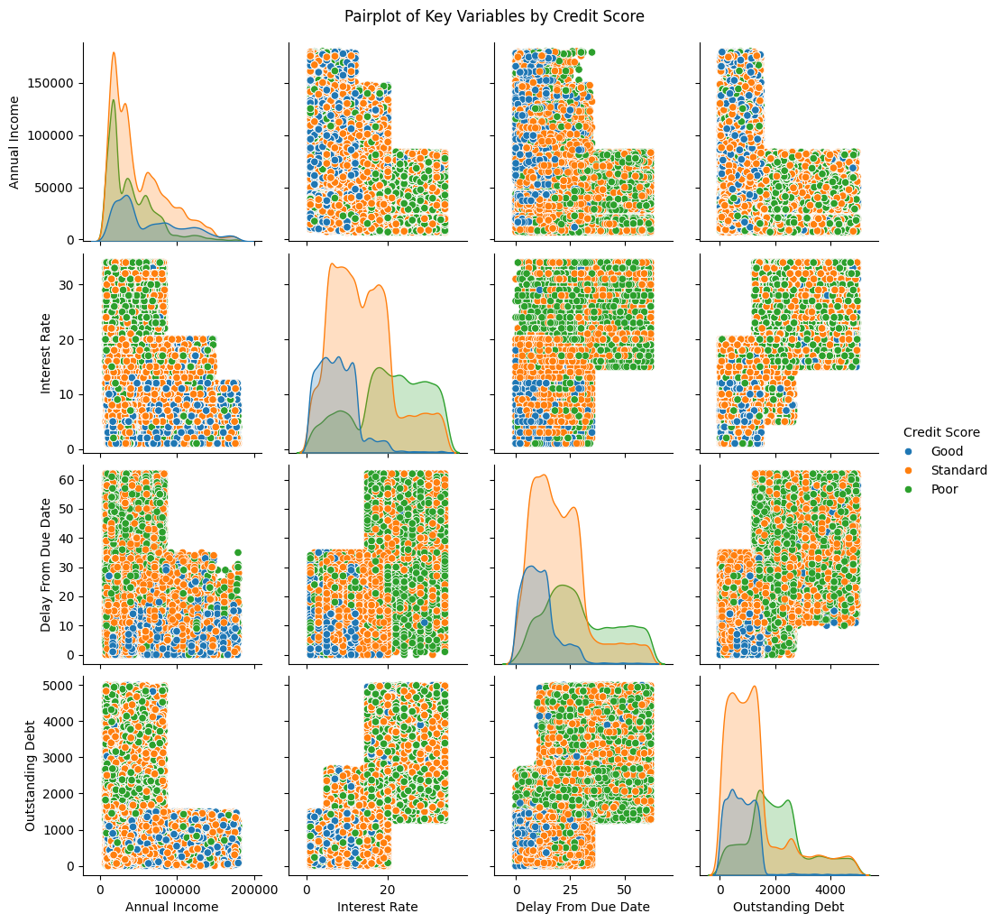

In [260]:
# Features across which pairplot will be plotted
features = ['Annual_Income', 'Interest_Rate', 'Delay_from_due_date', 'Outstanding_Debt','Credit_Score']

# Pairplot of Key Variables by Credit Score
plt.figure(figsize=(19.20,10.80)) # Setting resolution of plot
g = sns.pairplot(df[features].rename(columns={'Annual_Income':'Annual Income',
                                              'Interest_Rate':'Interest Rate',
                                              'Delay_from_due_date':'Delay From Due Date',
                                              'Outstanding_Debt':'Outstanding Debt',
                                              'Credit_Score':'Credit Score'}), hue='Credit Score')
g.fig.suptitle('Pairplot of Key Variables by Credit Score', y=1.02) # Setting title of the plot
plt.show() # Displaying the plot

##### 1. Why did you pick the specific chart?

I chose the pair plot because it provides a comprehensive overview of the interactions between several key numerical features at once. By plotting all pairwise relationships and coloring the points by Credit Score, I can visually inspect how different combinations of features, like Annual Income and Outstanding Debt, are distributed among the "Good," "Standard," and "Poor" credit score groups. This helps me identify which features, or combinations of features, have the most predictive power and will be most useful for building my classification model.

##### 2. What is/are the insight(s) found from the chart?

**Insights**

* <u>**Annual Income and Credit Score**</u>: The distributions for "Good," "Standard," and "Poor" credit scores overlap significantly in the Annual Income plots. However, the distribution for "Poor" credit scores seems to be more concentrated at the lower end of the income scale compared to "Good" credit scores. This suggests that while income is a factor, it alone is not a strong differentiator.

* <u>**Outstanding Debt and Credit Score**</u>: The scatter plots and histograms show a more distinct separation. Individuals with "Good" credit scores tend to have lower Outstanding Debt and a tighter distribution around the lower debt values. Conversely, "Poor" credit scores show a much wider and higher distribution of Outstanding Debt. This suggests that Outstanding Debt is a strong indicator of credit score.

* <u>**Delay from Due Date and Credit Score**</u>: There is a clear visual separation here. Individuals with "Good" credit scores have a very high concentration of values near zero for Delay From Due Date. As the number of delayed days increases, the likelihood of a "Poor" credit score also increases, as shown by the orange and red points becoming more prevalent in the scatter plots. This confirms that payment behavior is a critical feature for creditworthiness.

* <u>**Interest Rate and Credit Score**</u>: The histograms and scatter plots show that "Good" credit scores are predominantly associated with lower interest rates. The distribution for "Poor" credit scores, on the other hand, is heavily concentrated at higher interest rates. This is a strong and logical relationship that confirms Interest Rate is a powerful predictor.

## **5. Solution to Business Objective**

#### What do you suggest the client to achieve Business Objective ?
Explain Briefly.

1. <u>**Refine the Credit Scoring Model**</u>
* **Prioritize Key Features**: Your analysis has identified several powerful predictors. The new model should place a higher weight on Outstanding Debt, Delay from Due Date, and Credit History Age as these show a strong correlation with credit score. The Number of Loans and Credit Mix should also be prioritized over Credit Utilization Ratio, which you found to have limited explanatory power.

* **Integrate Behavioral Features**: The model should explicitly incorporate the "risk threshold" identified in your analysis, such as the point where delayed payments exceed five, to better classify high-risk individuals.

* **Address Data Imbalance**: Since "Good" credit scores are the minority, use techniques like oversampling (e.g., SMOTE) or class weighting during model training to ensure the model can accurately predict this crucial segment and avoid misclassification.

2. <u>**Implement a Multi-Faceted Customer Strategy**</u>
* **Target "Standard" Score Customers**: Since this is your largest segment, create a dedicated program to help them improve their scores. This can include targeted financial education, personalized advice on managing debt, or offering credit-builder products. The goal is to move them into the "Good" category, increasing customer lifetime value.

* **Mitigate Risk in "Poor" Score and High-Risk Segments**: For customers with "Poor" credit scores and those with a short credit history, offer lower-risk products like secured loans or pre-paid cards. You should also implement stricter checks on high-risk groups, such as those with a high number of delayed payments or high outstanding debt, to protect the company and its partners from defaults.

* **Leverage Timeliness and Demographics**: Use the insights on seasonal and age-related trends to time your marketing campaigns. For instance, launch campaigns for personal loans to the "Good" credit segment during the April fiscal planning cycle. For younger customers with poor credit scores, offer targeted financial literacy resources.

3. <u>**Enhance Operational Vigilance and Data Integrity**</u>
* **Investigate Malpractices**: The insight about loans given to underaged individuals is a critical finding that demands immediate investigation. The client should audit its loan approval process and data entry practices to prevent potential legal and reputational risks.

* **Strengthen Internal Monitoring**: Use the identified correlations (e.g., Outstanding Debt and Num_Bank_Accounts) to create internal flags for manual review. If a customer has a large number of bank accounts but also high outstanding debt, it could be a sign of a complex financial situation that requires closer scrutiny.

* **Educate Customers**: The findings about Credit Mix and Payment of Min Amount show a potential lack of financial education. The client should develop educational content to help customers understand that simply paying the minimum is not a sign of financial health and that managing the number of loans and credit mix is key to improving their score. This empowers customers while simultaneously improving the overall quality of Paisabazaar's loan portfolio.

# **Conclusion**

This project's comprehensive exploratory data analysis has successfully identified key features and relationships crucial for building a robust credit score prediction model. The analysis revealed that creditworthiness is a complex interplay of a customer's financial history, behavior, and demographics, not a single factor.

The core findings confirm that payment behavior is a primary driver of credit scores, with the number of delayed payments being a powerful indicator of risk. This is supported by the strong association between a longer credit history and higher credit scores, reinforcing the importance of long-term financial stability. Furthermore, debt and income are also strong predictors; specifically, low outstanding debt and a low credit utilization ratio are clear markers of a good credit score. A critical business opportunity was uncovered in the "Standard" credit score segment, which makes up over 50% of the customer base. This group represents a prime target for specialized programs designed to improve their scores. However, a significant challenge was also identified: the dataset is imbalanced, with "Good" credit scores being the least represented class. This must be addressed during the model-building phase to avoid a biased model that struggles to accurately predict high-quality customers.

Based on these insights, I recommend that Paisabazaar prioritize a predictive model that heavily weighs features such as Delay from Due Date, Outstanding Debt, and Credit History Age. The company should also develop targeted strategies for its different customer segments, focusing on credit-building tools and financial education for the "Standard" segment, and offering lower-risk products to the "Poor" segment. Lastly, the finding of loans given to underage individuals requires immediate action to address potential malpractices and reinforce data quality checks, ensuring compliance and ethical practices.

### ***Hurrah! You have successfully completed your EDA Capstone Project !!!***